#  Практическое задание № 2: ЕМ алгоритм для детектива
## Байесовские методы в машинном обучении, осень 2022

### Михеев Борис, ВМК МГУ, ММП, 417 группа

In [188]:
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
from boris_miheev import *
import time

## Изображения для проверки работы алгоритма

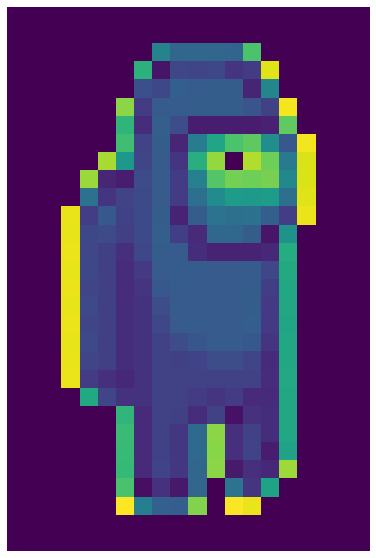

In [98]:
plt.figure(figsize=(15, 10))
obj = np.array(ImageOps.grayscale(Image.open("amogus.png")).resize((30, 30)), dtype=np.float32)
obj = np.where(obj >= 245, 0, obj)[:, 5:25]
plt.axis(False)
plt.imshow(obj)
plt.savefig('Obj_example.png')

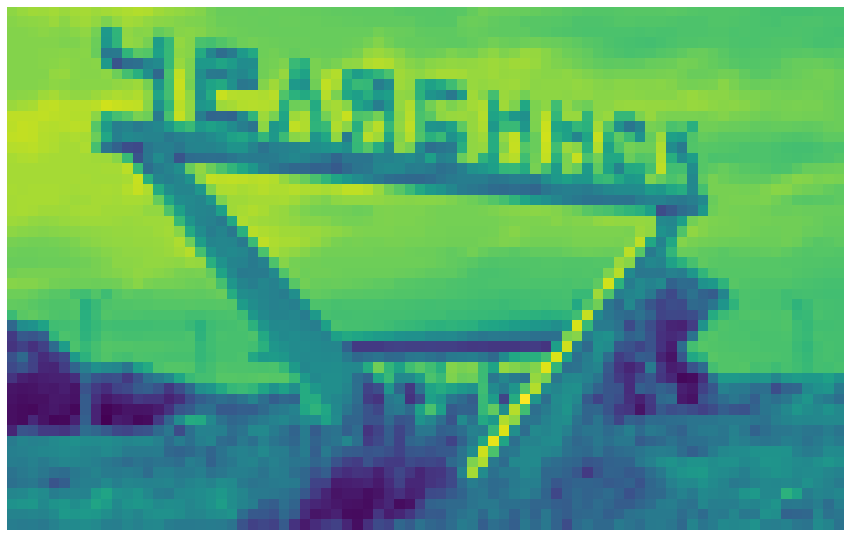

In [100]:
plt.figure(figsize=(15, 10))
background = np.array(ImageOps.grayscale(Image.open("bg.jpg")).resize((80, 50)), dtype=np.float32)
plt.imshow(background)
plt.axis(False)
plt.savefig('Bg_example.png')

## Функция для генерации зашумленных изображений

In [101]:
def generate_test_data(B, F, K, s=1):
    H, W = B.shape
    h, w = F.shape

    X = np.zeros((H, W, K))
    d_h = np.random.randint(0, H-h+1, size=K)
    d_w = np.random.randint(0, W-w+1, size=K)

    for k in range(K):
        X_k = np.copy(B)
        X_k[d_h[k]:d_h[k]+h, d_w[k]:d_w[k]+w] = np.where(F >= 10, F, X_k[d_h[k]:d_h[k]+h, d_w[k]:d_w[k]+w])
        X[:, :, k] = X_k

    return X + np.random.normal(0, s, X.shape)

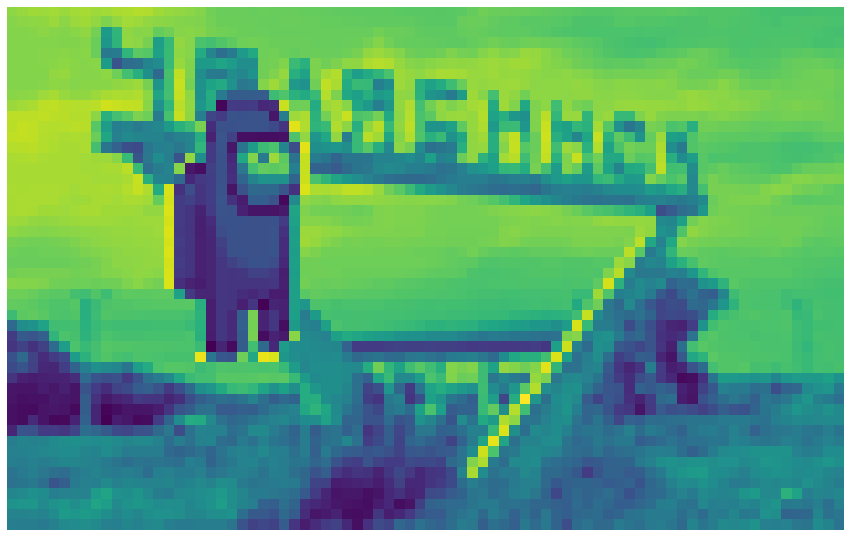

In [102]:
plt.figure(figsize=(15, 10))
data = generate_test_data(background, obj, 50, s=0)
plt.axis(False)
plt.imshow(data[:, :, 20])
plt.savefig('GenData_example.png')

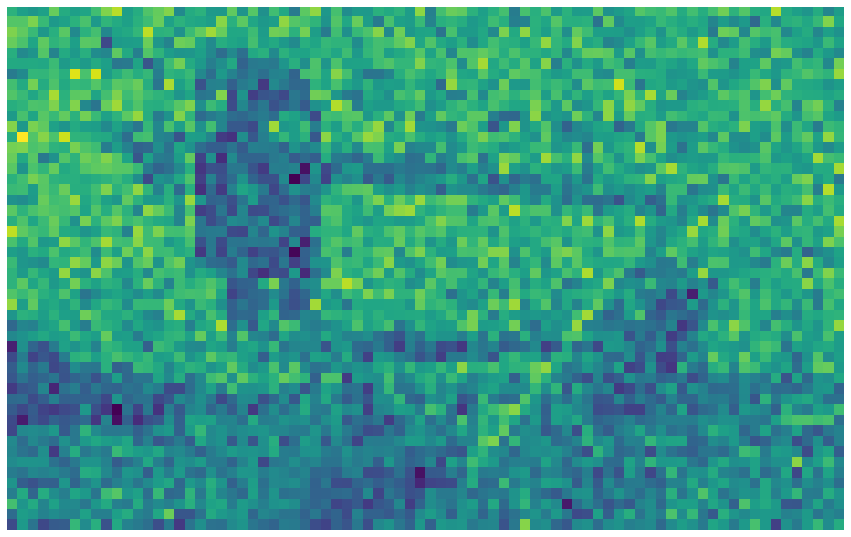

In [122]:
plt.figure(figsize=(15, 10))
data = generate_test_data(background, obj, 50, s=50)
plt.axis(False)
plt.imshow(data[:, :, 20])
plt.savefig('GenData_example_noised.png')

## Влияние начального приближения на результат работы алгоритма

1) F и B как максимальное значение X, умноженное на модуль случайной величины из $\mathcal{N}(0, 1)$

In [123]:
Fs = []
Bs = []
ss = []
As = []
LLs = []
for i in range(10):
    F, B, s, A, LL = run_EM(data, obj.shape[0], obj.shape[1], init_type='norm')
    Fs.append(F)
    Bs.append(B)
    ss.append(s)
    As.append(A)
    LLs.append(LL)

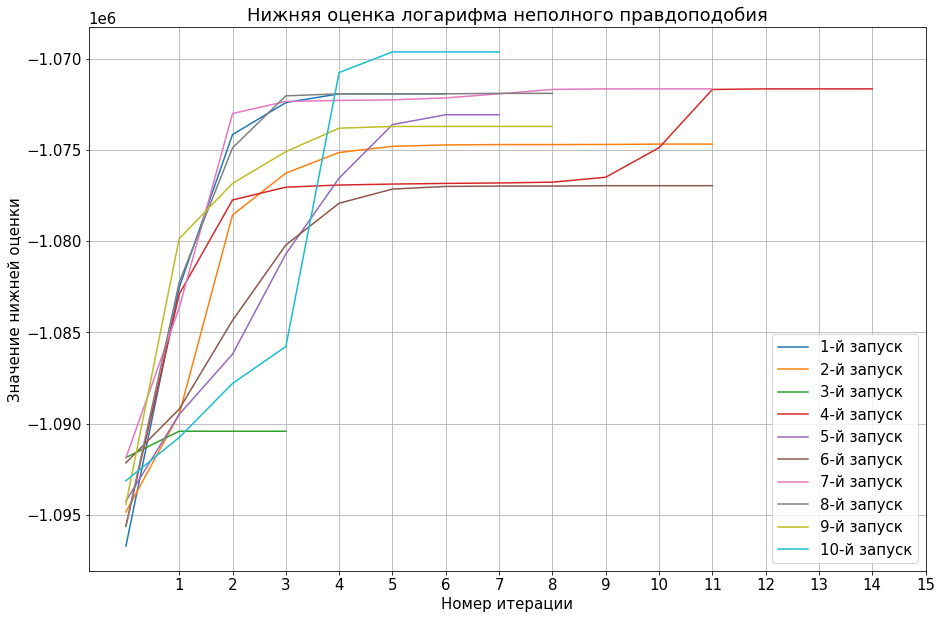

In [124]:
plt.rcParams['font.size']=15
plt.figure(figsize=(15, 10))
plt.title('Нижняя оценка логарифма неполного правдоподобия')
for i in range(len(LLs)):
    plt.plot(LLs[i], label=f'{i + 1}-й запуск')
plt.xticks(np.arange(max([len(x) for x in LLs])) + 1)
plt.xlabel('Номер итерации')
plt.ylabel('Значение нижней оценки')
plt.grid(True)
plt.legend()
plt.savefig('L_plot_norm.png')

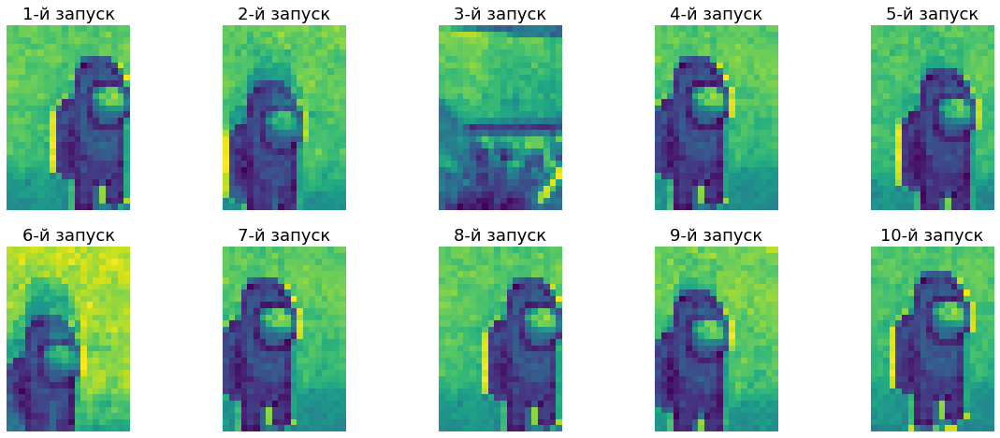

In [125]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Fs[i])
    
plt.savefig('Init_F_norm.png')

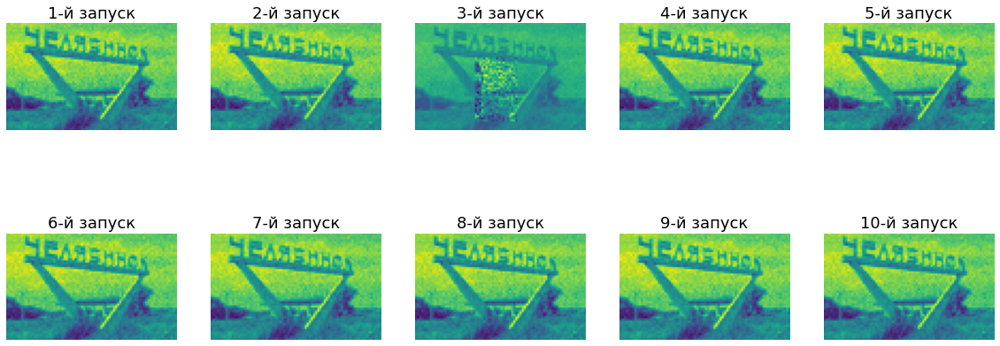

In [126]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Bs[i])
    
plt.savefig('Init_B_norm.png')

2) F и B как максимальное значение X, умноженное на случайную величину из $U[0,1]$

In [127]:
Fs = []
Bs = []
ss = []
As = []
LLs = []
for i in range(10):
    F, B, s, A, LL = run_EM(data, obj.shape[0], obj.shape[1], init_type='uniform')
    Fs.append(F)
    Bs.append(B)
    ss.append(s)
    As.append(A)
    LLs.append(LL)

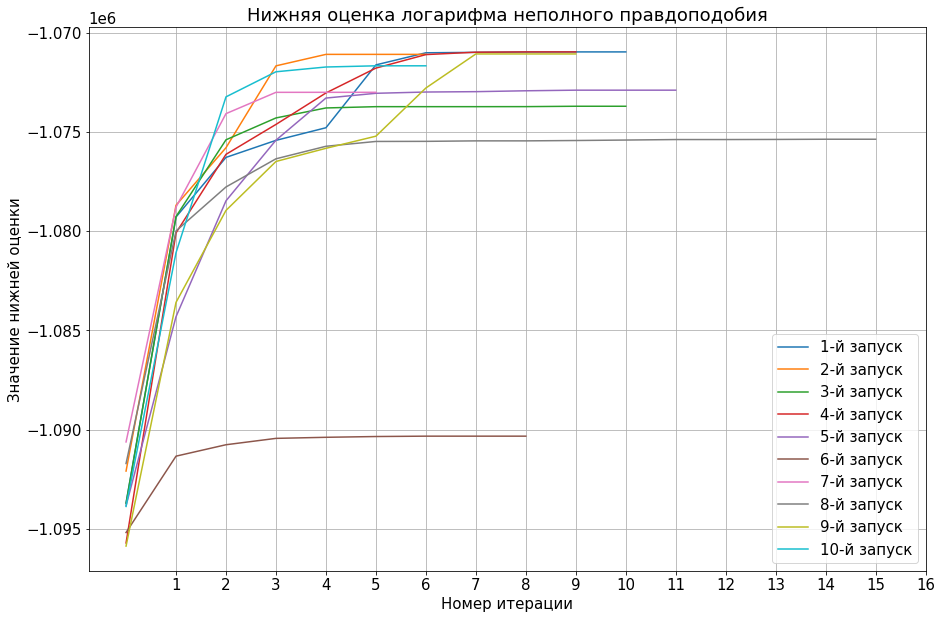

In [128]:
plt.figure(figsize=(15, 10))
plt.title('Нижняя оценка логарифма неполного правдоподобия')
for i in range(len(LLs)):
    plt.plot(LLs[i], label=f'{i + 1}-й запуск')
plt.xticks(np.arange(max([len(x) for x in LLs])) + 1)
plt.xlabel('Номер итерации')
plt.ylabel('Значение нижней оценки')
plt.grid(True)
plt.legend()
plt.savefig('L_plot_uniform.png')

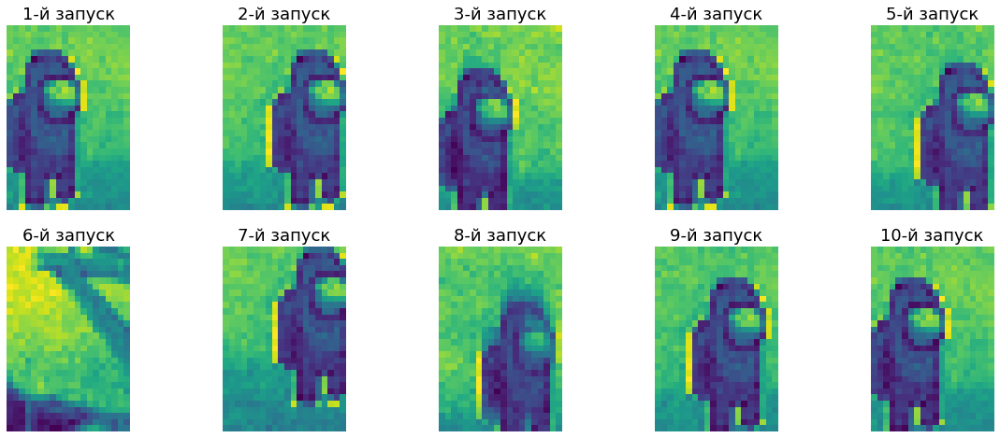

In [129]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Fs[i])
    
plt.savefig('Init_F_uniform.png')

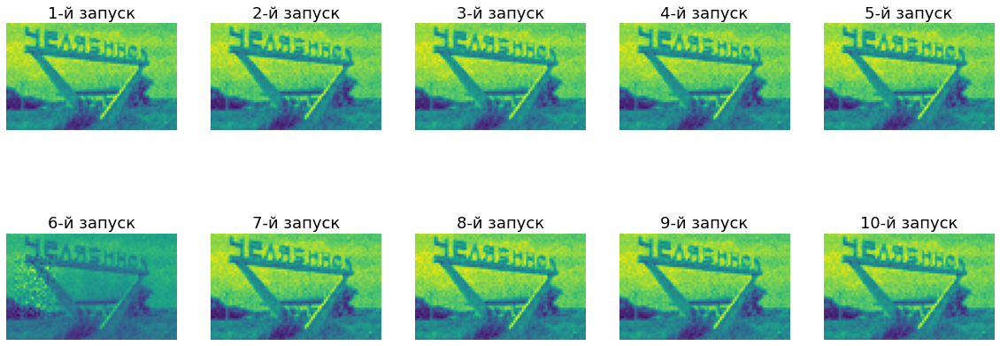

In [130]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Bs[i])
    
plt.savefig('Init_B_uniform.png')

3) B как среднее изображение по X, F как максимум B на $\mathcal{N}(0, 1)$

In [138]:
Fs = []
Bs = []
ss = []
As = []
LLs = []
for i in range(10):
    F, B, s, A, LL = run_EM(data, obj.shape[0], obj.shape[1], init_type='av_norm')
    Fs.append(F)
    Bs.append(B)
    ss.append(s)
    As.append(A)
    LLs.append(LL)

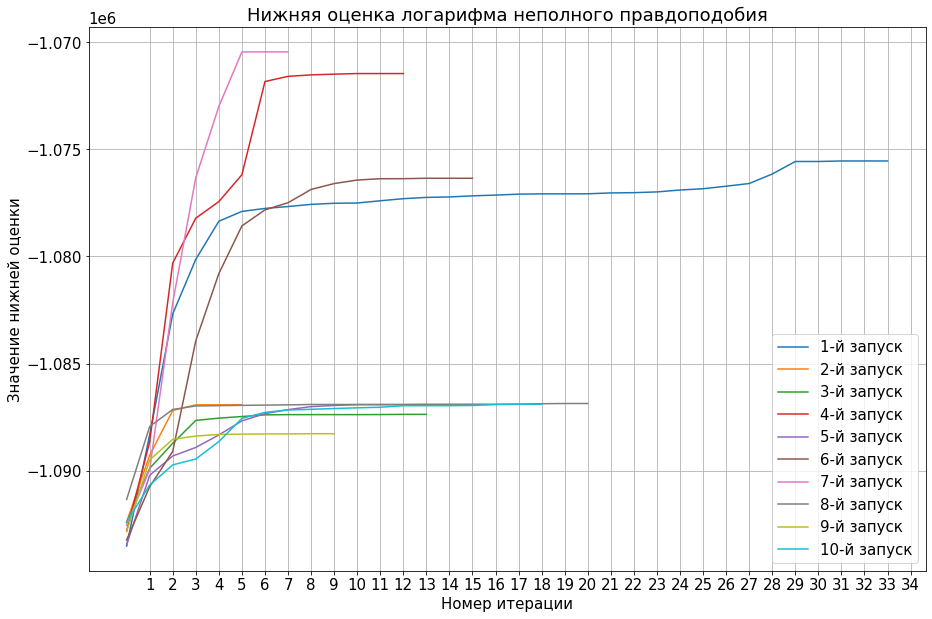

In [139]:
plt.figure(figsize=(15, 10))
plt.title('Нижняя оценка логарифма неполного правдоподобия')
for i in range(len(LLs)):
    plt.plot(LLs[i], label=f'{i + 1}-й запуск')
plt.xticks(np.arange(max([len(x) for x in LLs])) + 1)
plt.xlabel('Номер итерации')
plt.ylabel('Значение нижней оценки')
plt.grid(True)
plt.legend()
plt.savefig('L_plot_av_norm.png')

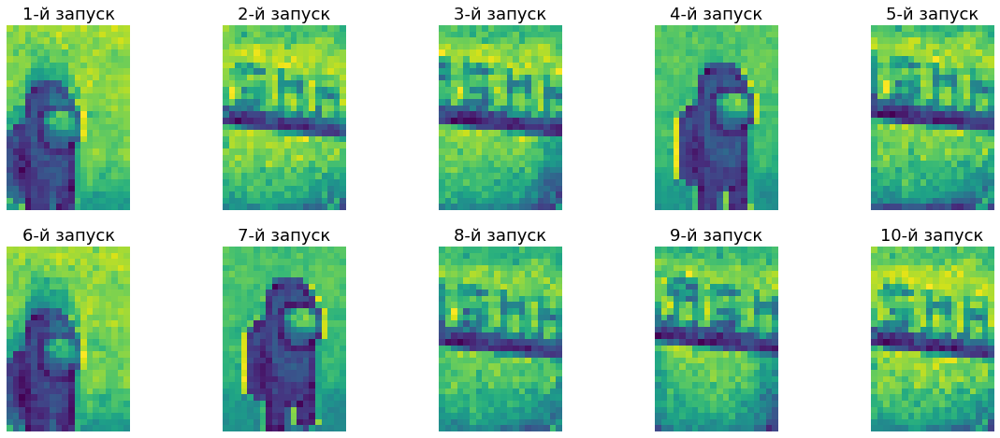

In [140]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Fs[i])
    
plt.savefig('Init_F_av_norm.png')

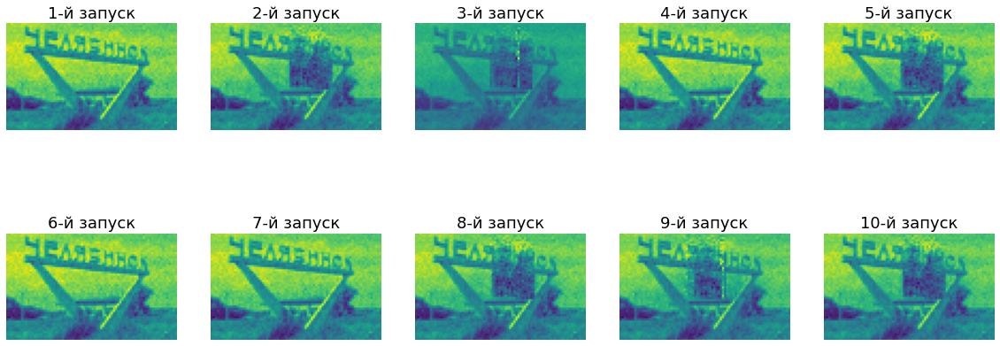

In [141]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Bs[i])
    
plt.savefig('Init_B_av_norm.png')

4) B как среднее изображение по X, F как максимум X на $\mathcal{N}(0, 1)$

In [146]:
Fs = []
Bs = []
ss = []
As = []
LLs = []
for i in range(10):
    F, B, s, A, LL = run_EM(data, obj.shape[0], obj.shape[1], init_type='av_norm_globF')
    Fs.append(F)
    Bs.append(B)
    ss.append(s)
    As.append(A)
    LLs.append(LL)

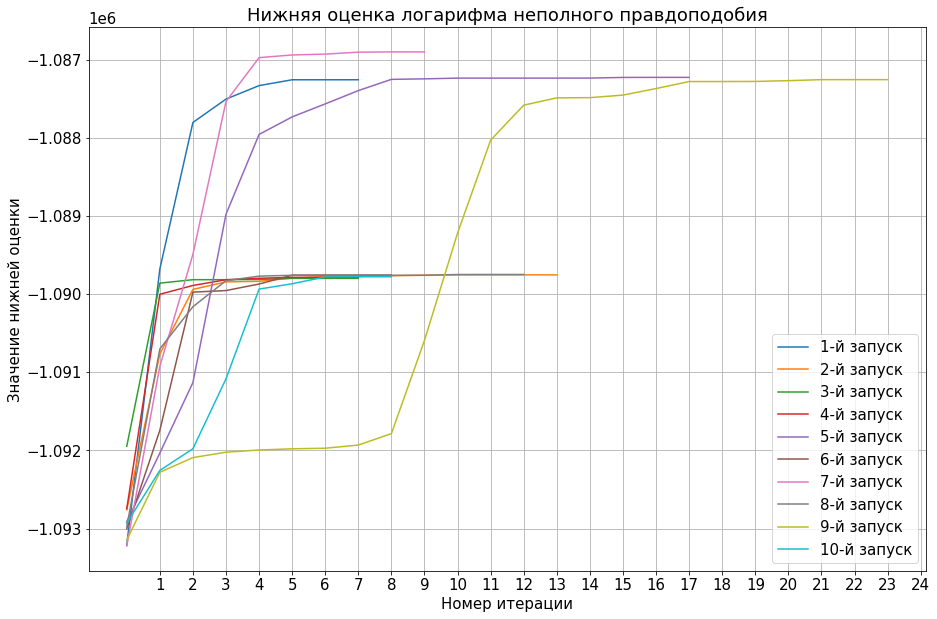

In [147]:
plt.figure(figsize=(15, 10))
plt.title('Нижняя оценка логарифма неполного правдоподобия')
for i in range(len(LLs)):
    plt.plot(LLs[i], label=f'{i + 1}-й запуск')
plt.xticks(np.arange(max([len(x) for x in LLs])) + 1)
plt.xlabel('Номер итерации')
plt.ylabel('Значение нижней оценки')
plt.grid(True)
plt.legend()
plt.savefig('L_plot_av_norm_globF.png')

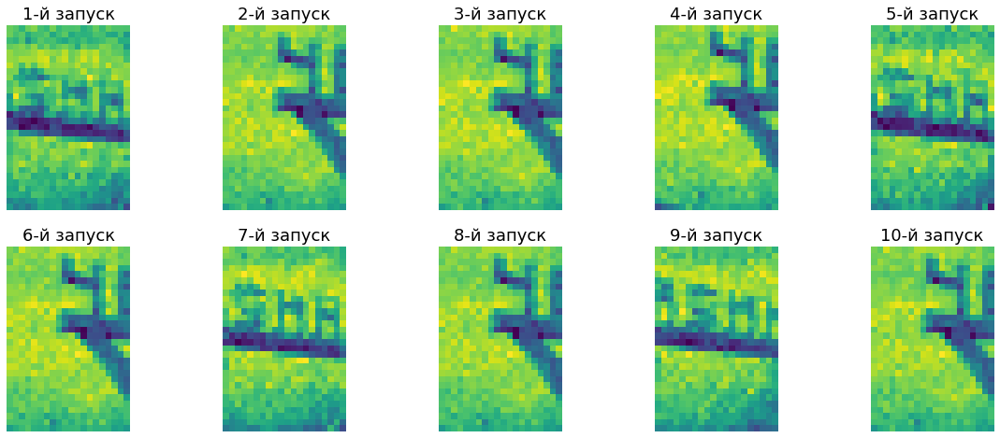

In [148]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Fs[i])
    
plt.savefig('Init_F_av_norm_globF.png')

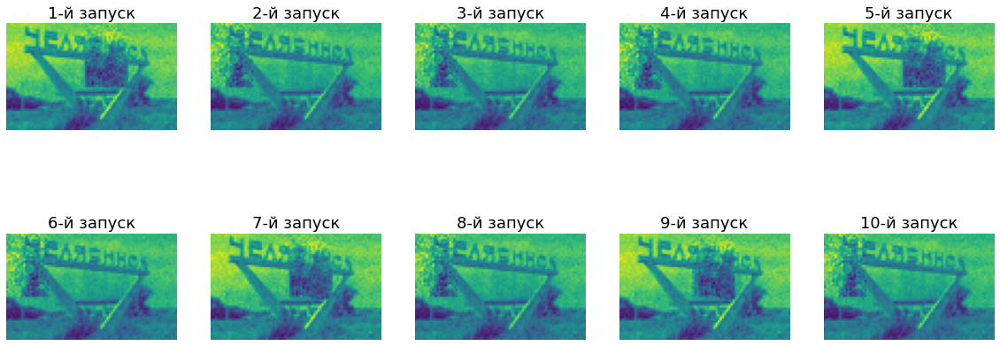

In [149]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Bs[i])
    
plt.savefig('Init_B_av_norm_globF.png')

5) B как среднее изображение по X, F как максимум B на $U[0, 1]$

In [150]:
Fs = []
Bs = []
ss = []
As = []
LLs = []
for i in range(10):
    F, B, s, A, LL = run_EM(data, obj.shape[0], obj.shape[1], init_type='av_uniform')
    Fs.append(F)
    Bs.append(B)
    ss.append(s)
    As.append(A)
    LLs.append(LL)

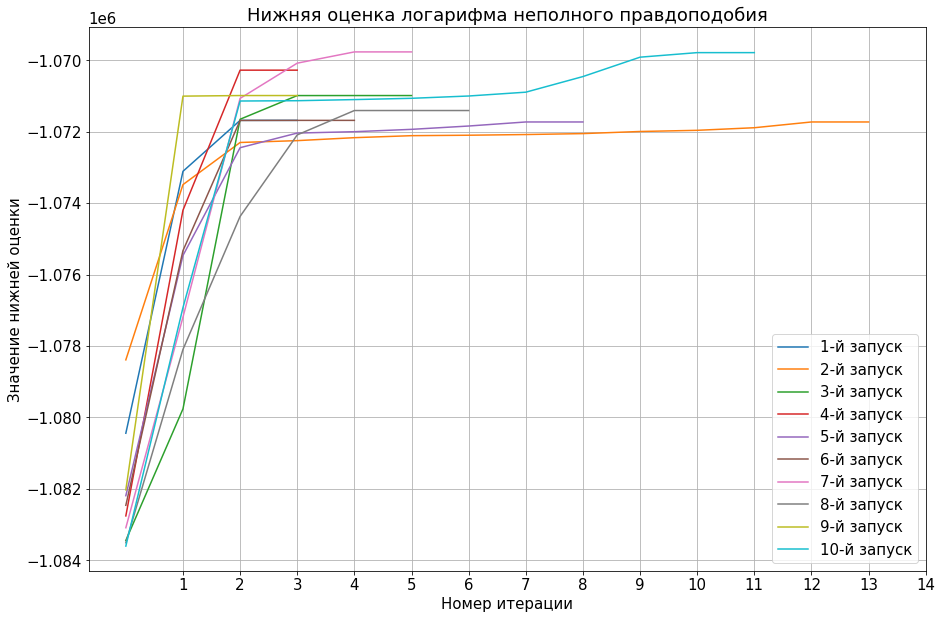

In [151]:
plt.figure(figsize=(15, 10))
plt.title('Нижняя оценка логарифма неполного правдоподобия')
for i in range(len(LLs)):
    plt.plot(LLs[i], label=f'{i + 1}-й запуск')
plt.xticks(np.arange(max([len(x) for x in LLs])) + 1)
plt.xlabel('Номер итерации')
plt.ylabel('Значение нижней оценки')
plt.grid(True)
plt.legend()
plt.savefig('L_plot_av_uniform.png')

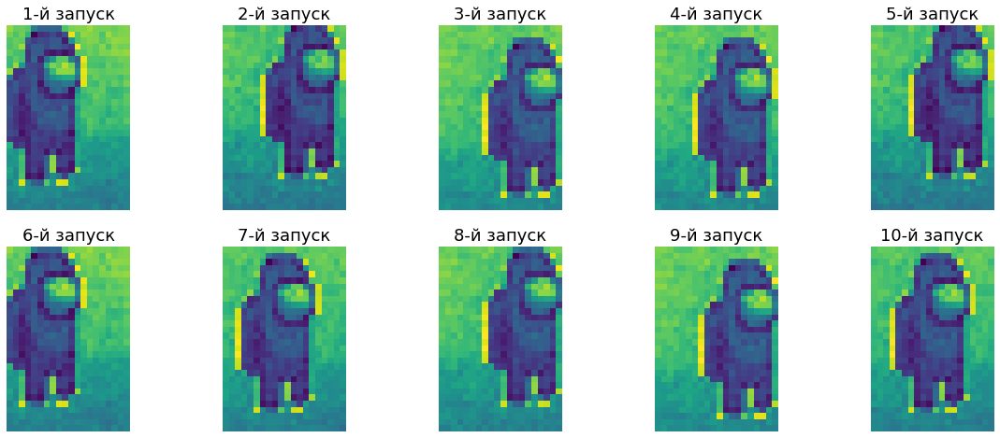

In [152]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Fs[i])
    
plt.savefig('Init_F_av_uniform.png')

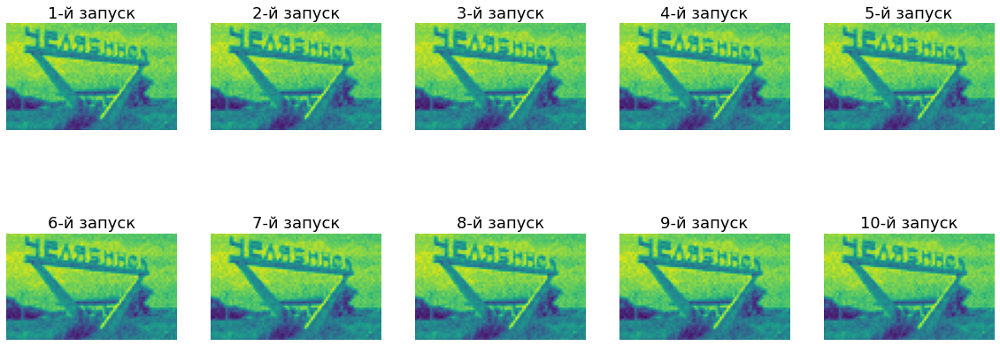

In [153]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Bs[i])
    
plt.savefig('Init_B_av_uniform.png')

6) B как среднее изображение по X, F как максимум X на $U[0, 1]$

In [159]:
Fs = []
Bs = []
ss = []
As = []
LLs = []
for i in range(10):
    F, B, s, A, LL = run_EM(data, obj.shape[0], obj.shape[1], init_type='av_uniform_globF')
    Fs.append(F)
    Bs.append(B)
    ss.append(s)
    As.append(A)
    LLs.append(LL)

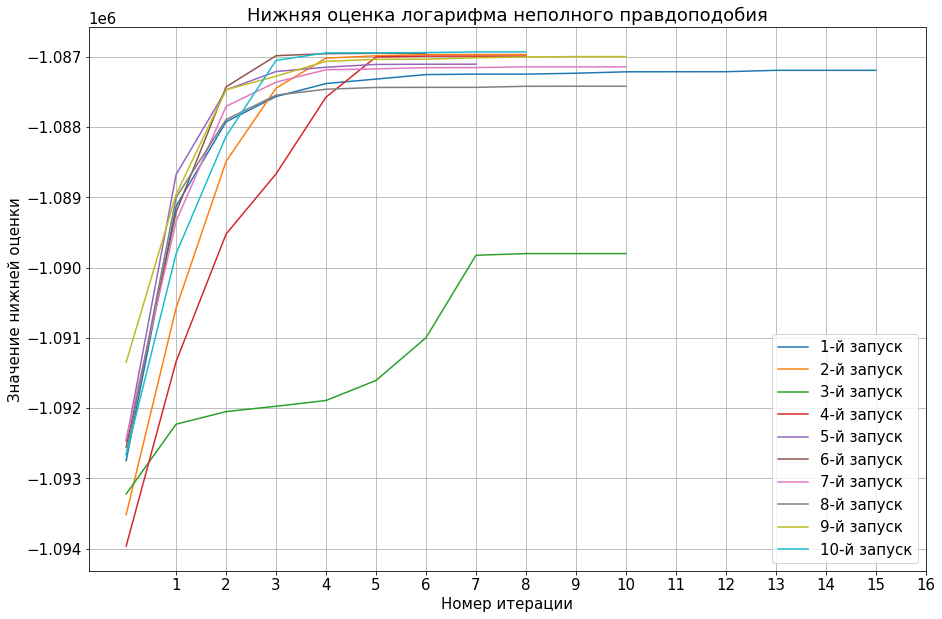

In [160]:
plt.figure(figsize=(15, 10))
plt.title('Нижняя оценка логарифма неполного правдоподобия')
for i in range(len(LLs)):
    plt.plot(LLs[i], label=f'{i + 1}-й запуск')
plt.xticks(np.arange(max([len(x) for x in LLs])) + 1)
plt.xlabel('Номер итерации')
plt.ylabel('Значение нижней оценки')
plt.grid(True)
plt.legend()
plt.savefig('L_plot_av_uniform_globF.png')

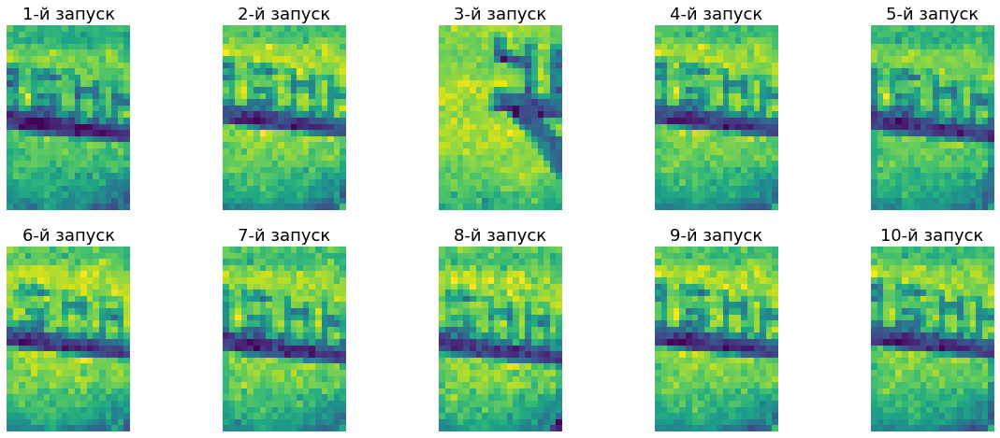

In [161]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Fs[i])
    
plt.savefig('Init_F_av_uniform_globF.png')

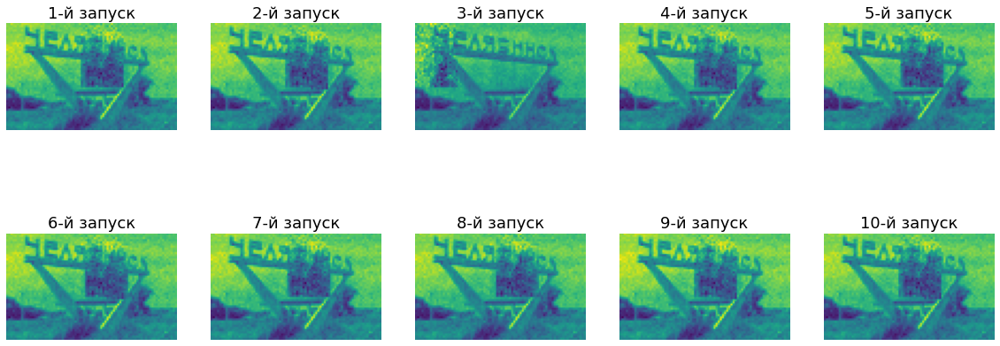

In [162]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Bs[i])
    
plt.savefig('Init_B_av_uniform_globF.png')

## Влияние размера выборки и уровня шума на результат

In [189]:
ss = [1, 10, 20, 30, 50, 100, 150, 200]
Ks = [10, 50, 100, 200, 500, 1000]

res = []

for i in range(len(Ks)):
    temp = []
    for j in range(len(ss)):
        data_j = generate_test_data(background, obj, K=Ks[i], s=ss[j])
        start = time.perf_counter()
        params = run_EM_with_restarts(data_j, obj.shape[0], obj.shape[1], max_iter=50, n_restarts=10, init_type='av_uniform')
        stop = time.perf_counter() - start
        params = params + (stop,)
        temp.append(params)
    res.append(temp)

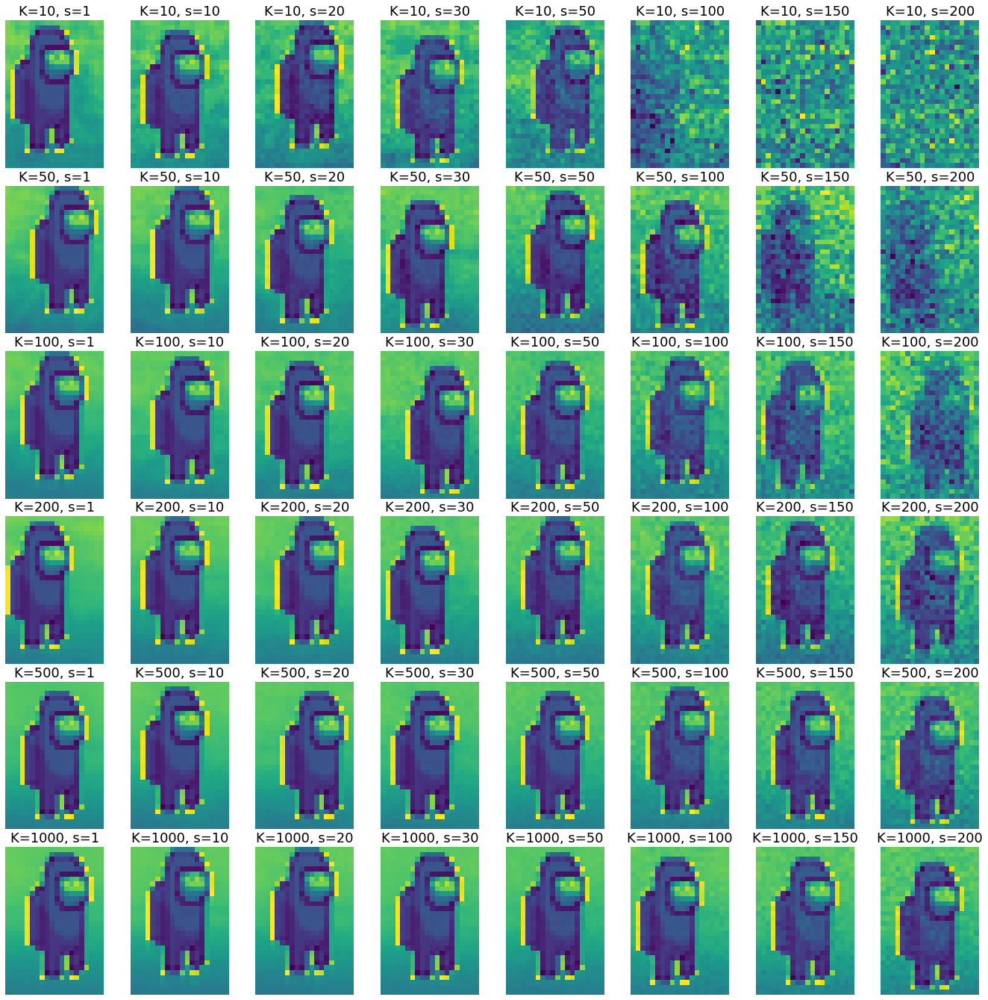

In [190]:
fig, axes = plt.subplots(ncols=8, nrows=6, figsize=(24, 24))

for i in range(len(Ks)):
    for j in range(len(ss)):
        F, B, s, A, L, t = res[i][j]
        axes_ij = axes[i, j]
        axes_ij.axis(False)
        axes_ij.imshow(F)
        axes_ij.set_title(f'K={Ks[i]}, s={ss[j]}')

plt.subplots_adjust(wspace=0.01, hspace=0.12)
plt.savefig('F_K_s.png')

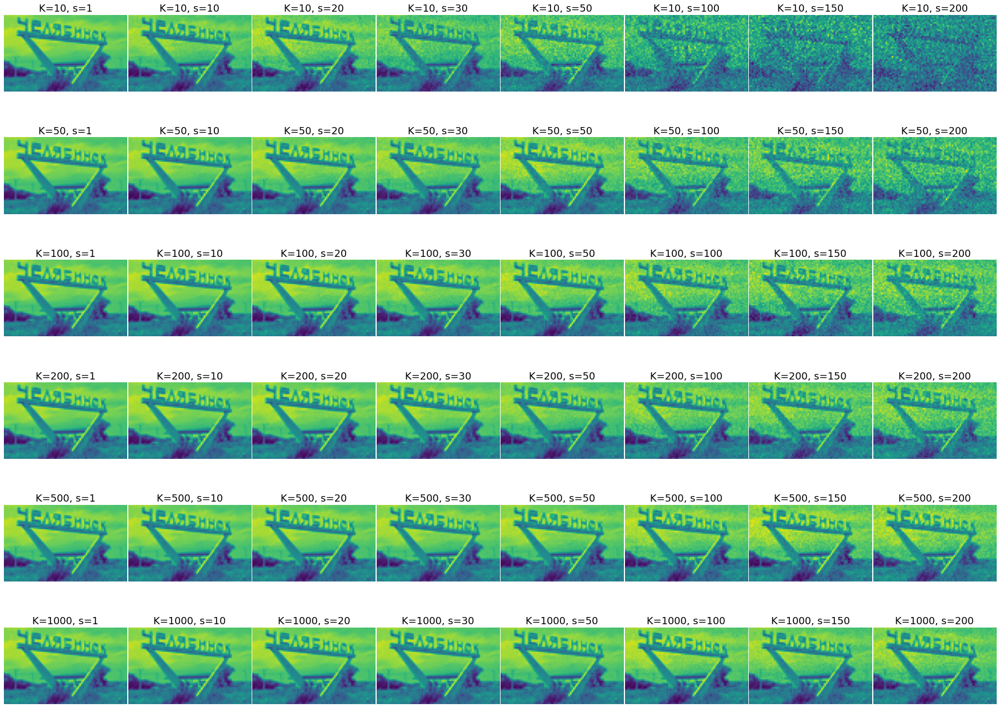

In [191]:
fig, axes = plt.subplots(ncols=8, nrows=6, figsize=(32, 24))

for i in range(len(Ks)):
    for j in range(len(ss)):
        F, B, s, A, L, t = res[i][j]
        axes_ij = axes[i, j]
        axes_ij.axis(False)
        axes_ij.imshow(B)
        axes_ij.set_title(f'K={Ks[i]}, s={ss[j]}')

plt.subplots_adjust(wspace=0.01, hspace=0.1)
plt.savefig('B_K_s.png')

In [192]:
print('EM, lower bound:')
print()
for i in range(len(Ks)):
    for j in range(len(ss)):
        print(f'K={Ks[i]}, s={ss[j]}, L={res[i][j][-2]/Ks[i]}')

EM, lower bound:

K=10, s=1, L=-15613.45316732917
K=10, s=10, L=-16553.4262443657
K=10, s=20, L=-18156.177537843374
K=10, s=30, L=-19344.48155596101
K=10, s=50, L=-21214.74534253007
K=10, s=100, L=-23943.418468127737
K=10, s=150, L=-25560.720276148077
K=10, s=200, L=-26666.446697652806
K=50, s=1, L=-16209.793481741777
K=50, s=10, L=-16858.87038418849
K=50, s=20, L=-18278.34807286753
K=50, s=30, L=-19567.960508301283
K=50, s=50, L=-21413.75282720009
K=50, s=100, L=-24086.914407900927
K=50, s=150, L=-25704.22992084277
K=50, s=200, L=-26841.870992067557
K=100, s=1, L=-16008.192199329798
K=100, s=10, L=-16814.475744672272
K=100, s=20, L=-18282.16302622823
K=100, s=30, L=-19589.45456431424
K=100, s=50, L=-21421.838018766524
K=100, s=100, L=-24101.77574420782
K=100, s=150, L=-25719.808888234926
K=100, s=200, L=-26861.20223558702
K=200, s=1, L=-16004.621182805367
K=200, s=10, L=-16837.982582444834
K=200, s=20, L=-18373.59357004739
K=200, s=30, L=-19599.162391983544
K=200, s=50, L=-21444.53182

In [193]:
print('EM, time:')
print()
for i in range(len(Ks)):
    for j in range(len(ss)):
        print(f'K={Ks[i]}, s={ss[j]}, t={res[i][j][-1]}')

EM, time:

K=10, s=1, t=2.0672856099990895
K=10, s=10, t=1.8273823669878766
K=10, s=20, t=1.5866054979996989
K=10, s=30, t=1.8540960529935546
K=10, s=50, t=2.0019156749913236
K=10, s=100, t=1.316028743996867
K=10, s=150, t=1.2697207179880934
K=10, s=200, t=1.7585793499893043
K=50, s=1, t=7.972810629988089
K=50, s=10, t=8.599350037999102
K=50, s=20, t=8.705988747999072
K=50, s=30, t=10.251599820010597
K=50, s=50, t=14.77026214999205
K=50, s=100, t=28.930026179004926
K=50, s=150, t=44.5314676459966
K=50, s=200, t=16.35945816199819
K=100, s=1, t=12.906737680998049
K=100, s=10, t=12.5545173970022
K=100, s=20, t=15.755910360006965
K=100, s=30, t=19.4394919280021
K=100, s=50, t=25.917995142997825
K=100, s=100, t=56.588576365000335
K=100, s=150, t=115.64981632100535
K=100, s=200, t=107.64966675300093
K=200, s=1, t=32.02347810700303
K=200, s=10, t=34.28161485900637
K=200, s=20, t=41.73158837399387
K=200, s=30, t=40.81820640299702
K=200, s=50, t=52.320291889001965
K=200, s=100, t=116.0058275769

## Сравнение EM и Hard EM

In [195]:
ss = [1, 10, 20, 30, 50, 100, 150, 200]
Ks = [10, 50, 100, 200, 500, 1000]

res = []

for i in range(len(Ks)):
    temp = []
    for j in range(len(ss)):
        data_j = generate_test_data(background, obj, K=Ks[i], s=ss[j])
        start = time.perf_counter()
        params = run_EM_with_restarts(data_j, obj.shape[0], obj.shape[1], max_iter=50, n_restarts=10, use_MAP=True, init_type='av_uniform')
        stop = time.perf_counter() - start
        params = params + (stop,)
        temp.append(params)
    res.append(temp)

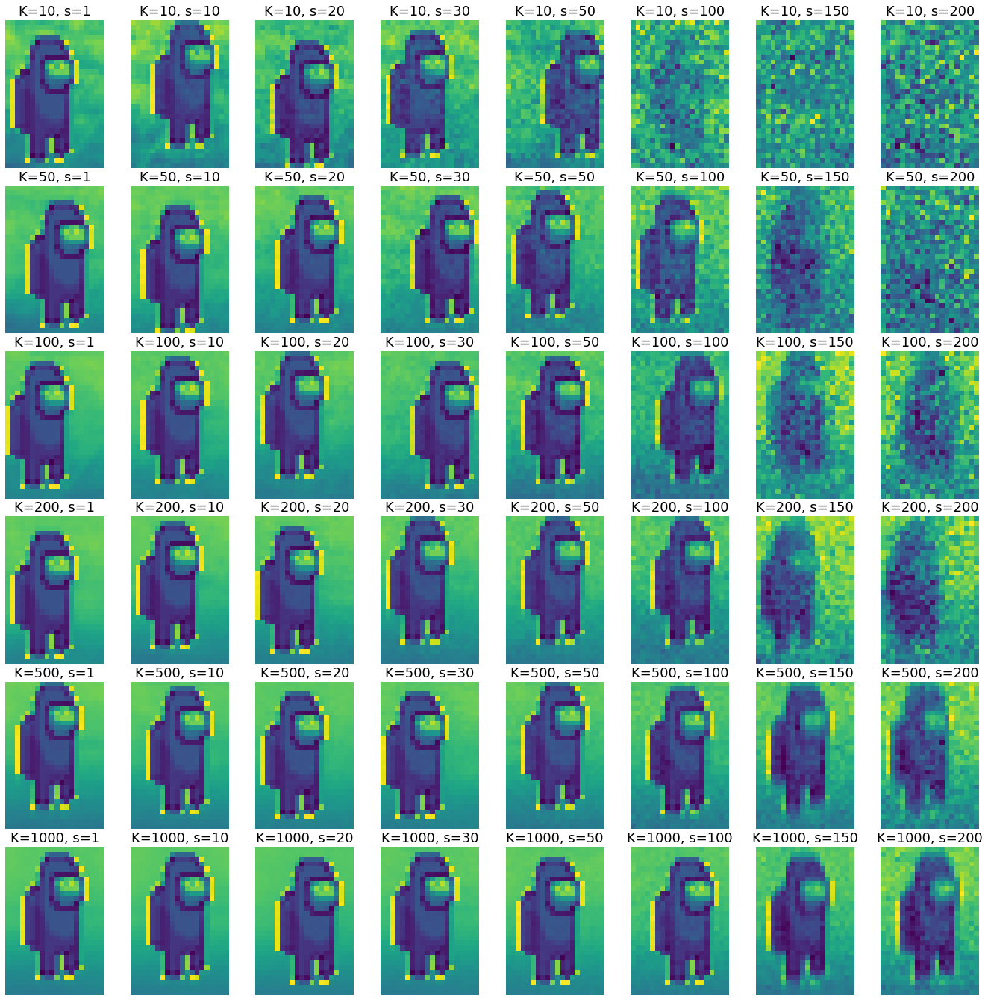

In [196]:
fig, axes = plt.subplots(ncols=8, nrows=6, figsize=(24, 24))

for i in range(len(Ks)):
    for j in range(len(ss)):
        F, B, s, A, L, t = res[i][j]
        axes_ij = axes[i, j]
        axes_ij.axis(False)
        axes_ij.imshow(F)
        axes_ij.set_title(f'K={Ks[i]}, s={ss[j]}')

plt.subplots_adjust(wspace=0.01, hspace=0.12)
plt.savefig('F_K_s_MAP.png')

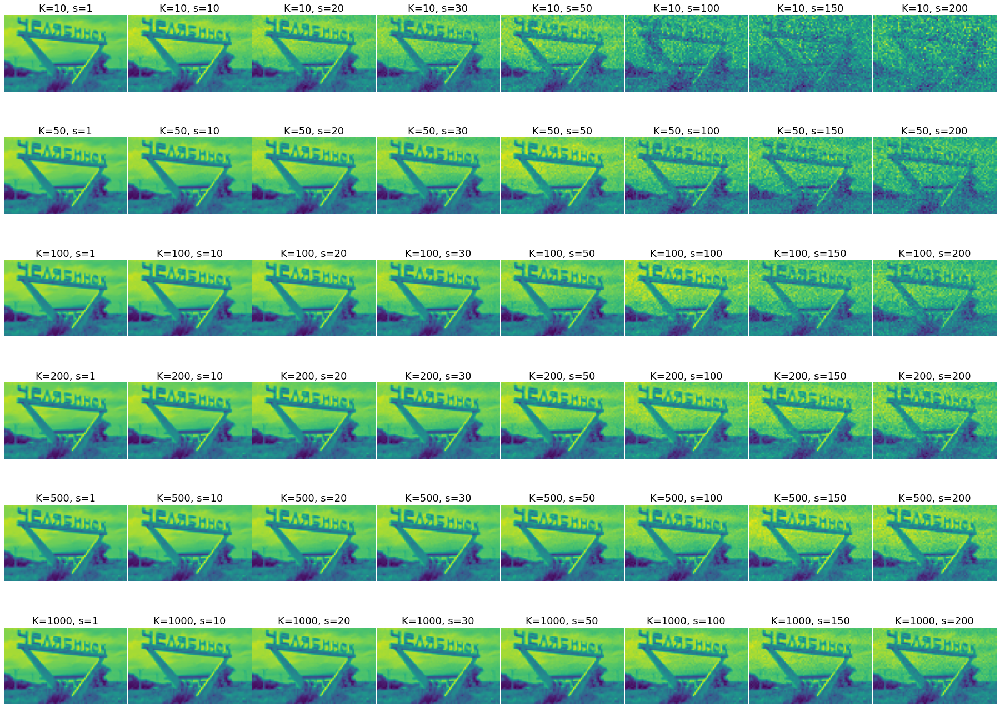

In [197]:
fig, axes = plt.subplots(ncols=8, nrows=6, figsize=(32, 24))

for i in range(len(Ks)):
    for j in range(len(ss)):
        F, B, s, A, L, t = res[i][j]
        axes_ij = axes[i, j]
        axes_ij.axis(False)
        axes_ij.imshow(B)
        axes_ij.set_title(f'K={Ks[i]}, s={ss[j]}')

plt.subplots_adjust(wspace=0.01, hspace=0.1)
plt.savefig('B_K_s_MAP.png')

In [198]:
print('Hard EM, lower bound:')
print()
for i in range(len(Ks)):
    for j in range(len(ss)):
        print(f'K={Ks[i]}, s={ss[j]}, L={res[i][j][-2]/Ks[i]}')

Hard EM, lower bound:

K=10, s=1, L=-15511.120090443195
K=10, s=10, L=-16852.129013816048
K=10, s=20, L=-18027.02255904051
K=10, s=30, L=-19351.915183750007
K=10, s=50, L=-21193.145348256927
K=10, s=100, L=-23993.934298473825
K=10, s=150, L=-25529.879842632166
K=10, s=200, L=-26665.735336973816
K=50, s=1, L=-15742.740518558712
K=50, s=10, L=-16768.653018577064
K=50, s=20, L=-18259.272067864167
K=50, s=30, L=-19578.698761603217
K=50, s=50, L=-21412.05216635544
K=50, s=100, L=-24090.29604800975
K=50, s=150, L=-25715.363098966252
K=50, s=200, L=-26851.542371607316
K=100, s=1, L=-15781.267200690176
K=100, s=10, L=-16819.2867101162
K=100, s=20, L=-18309.4885239992
K=100, s=30, L=-19612.997269303713
K=100, s=50, L=-21428.548728789032
K=100, s=100, L=-24125.496739988597
K=100, s=150, L=-25726.487725296127
K=100, s=200, L=-26869.576420856687
K=200, s=1, L=-15764.159886957004
K=200, s=10, L=-16837.343604910555
K=200, s=20, L=-18369.837977151314
K=200, s=30, L=-19643.56716968794
K=200, s=50, L=-

In [199]:
print('Hard EM, time:')
print()
for i in range(len(Ks)):
    for j in range(len(ss)):
        print(f'K={Ks[i]}, s={ss[j]}, t={res[i][j][-1]}')

Hard EM, time:

K=10, s=1, t=1.625393365000491
K=10, s=10, t=1.6836592409963487
K=10, s=20, t=1.7412038180045784
K=10, s=30, t=1.713681003995589
K=10, s=50, t=1.9241744149912847
K=10, s=100, t=0.881059441002435
K=10, s=150, t=0.8683108610130148
K=10, s=200, t=0.8638692810054636
K=50, s=1, t=7.021778897993499
K=50, s=10, t=6.83386477699969
K=50, s=20, t=6.719816775992513
K=50, s=30, t=8.327223407992278
K=50, s=50, t=9.68727907599532
K=50, s=100, t=13.90738047999912
K=50, s=150, t=9.485480841991375
K=50, s=200, t=4.283383667003363
K=100, s=1, t=15.588837242001318
K=100, s=10, t=12.767376136995154
K=100, s=20, t=13.127494987013051
K=100, s=30, t=14.313241786992876
K=100, s=50, t=15.618083146997378
K=100, s=100, t=35.95704296400072
K=100, s=150, t=23.403037255993695
K=100, s=200, t=21.50075984299474
K=200, s=1, t=37.792786731006345
K=200, s=10, t=29.643151184005546
K=200, s=20, t=31.969366931996774
K=200, s=30, t=31.291223631997127
K=200, s=50, t=38.42351231101202
K=200, s=100, t=59.474861

In [200]:
data = generate_test_data(background, obj, 50, s=50)

In [201]:
Fs = []
Bs = []
ss = []
As = []
LLs = []
ts = []
for i in range(100):
    start = time.perf_counter()
    F, B, s, A, LL = run_EM(data, obj.shape[0], obj.shape[1], init_type='av_uniform')
    stop = time.perf_counter() - start
    Fs.append(F)
    Bs.append(B)
    ss.append(s)
    As.append(A)
    LLs.append(LL)
    ts.append(stop)

In [202]:
print(f'EM, average time of single run: {np.mean(ts)}')

EM, average time of single run: 1.1161172310696565


In [203]:
Fs = []
Bs = []
ss = []
As = []
LLs = []
ts = []
for i in range(100):
    start = time.perf_counter()
    F, B, s, A, LL = run_EM(data, obj.shape[0], obj.shape[1], use_MAP=True, init_type='av_uniform')
    stop = time.perf_counter() - start
    Fs.append(F)
    Bs.append(B)
    ss.append(s)
    As.append(A)
    LLs.append(LL)
    ts.append(stop)

In [204]:
print(f'Hard-EM, average time of single run: {np.mean(ts)}')

Hard-EM, average time of single run: 1.0384986895485782


In [205]:
Fs = []
Bs = []
ss = []
As = []
LLs = []
ts = []
for i in range(10):
    start = time.perf_counter()
    F, B, s, A, LL = run_EM(data, obj.shape[0], obj.shape[1], init_type='av_uniform')
    stop = time.perf_counter() - start
    Fs.append(F)
    Bs.append(B)
    ss.append(s)
    As.append(A)
    LLs.append(LL)
    ts.append(stop)

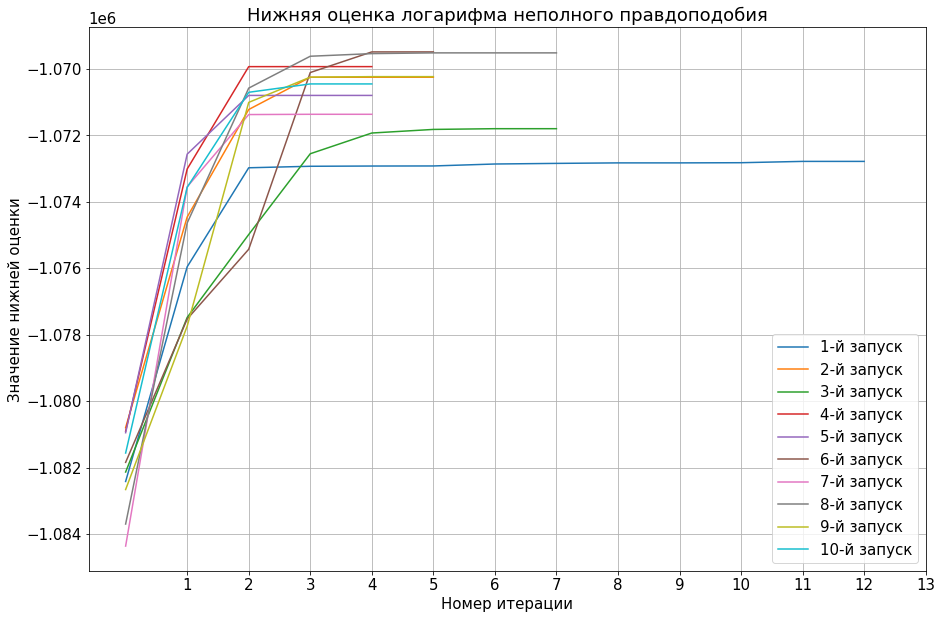

In [206]:
plt.figure(figsize=(15, 10))
plt.title('Нижняя оценка логарифма неполного правдоподобия')
for i in range(len(LLs)):
    plt.plot(LLs[i], label=f'{i + 1}-й запуск')
plt.xticks(np.arange(max([len(x) for x in LLs])) + 1)
plt.xlabel('Номер итерации')
plt.ylabel('Значение нижней оценки')
plt.grid(True)
plt.legend()
plt.savefig('L_plot_av_uniform_time.png')

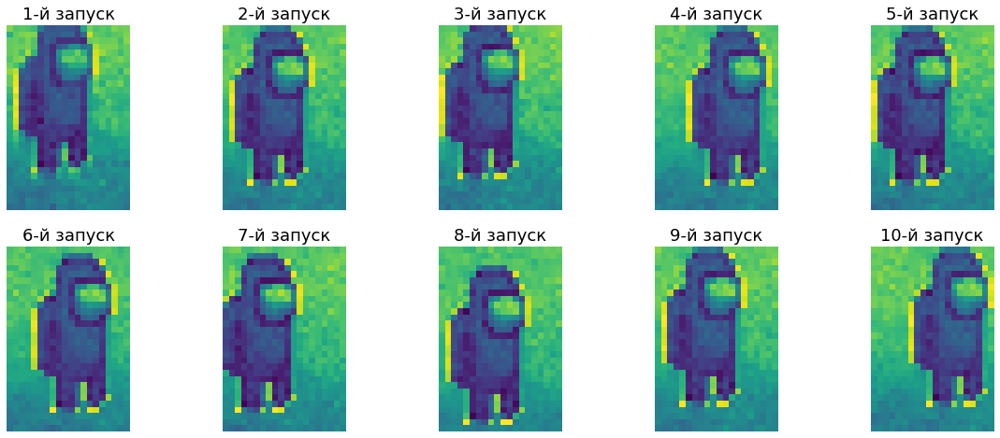

In [207]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Fs[i])
    
plt.savefig('F_av_uniform_time.png')

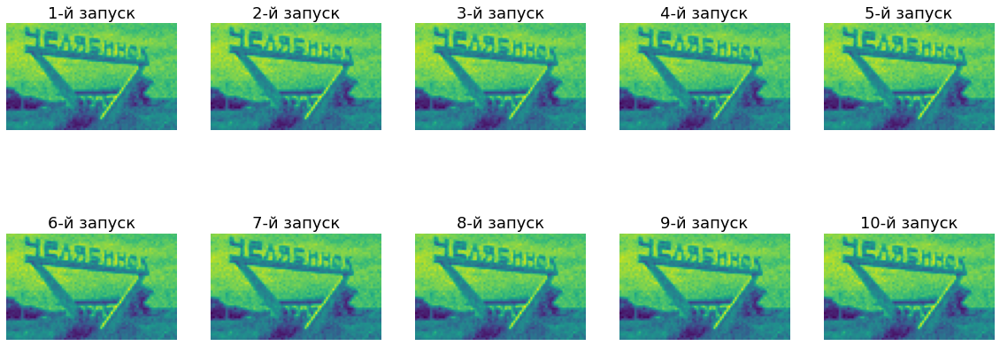

In [208]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Bs[i])
    
plt.savefig('B_av_uniform_time.png')

In [209]:
Fs = []
Bs = []
ss = []
As = []
LLs = []
ts = []
for i in range(10):
    start = time.perf_counter()
    F, B, s, A, LL = run_EM(data, obj.shape[0], obj.shape[1], use_MAP=True, init_type='av_uniform')
    stop = time.perf_counter() - start
    Fs.append(F)
    Bs.append(B)
    ss.append(s)
    As.append(A)
    LLs.append(LL)
    ts.append(stop)

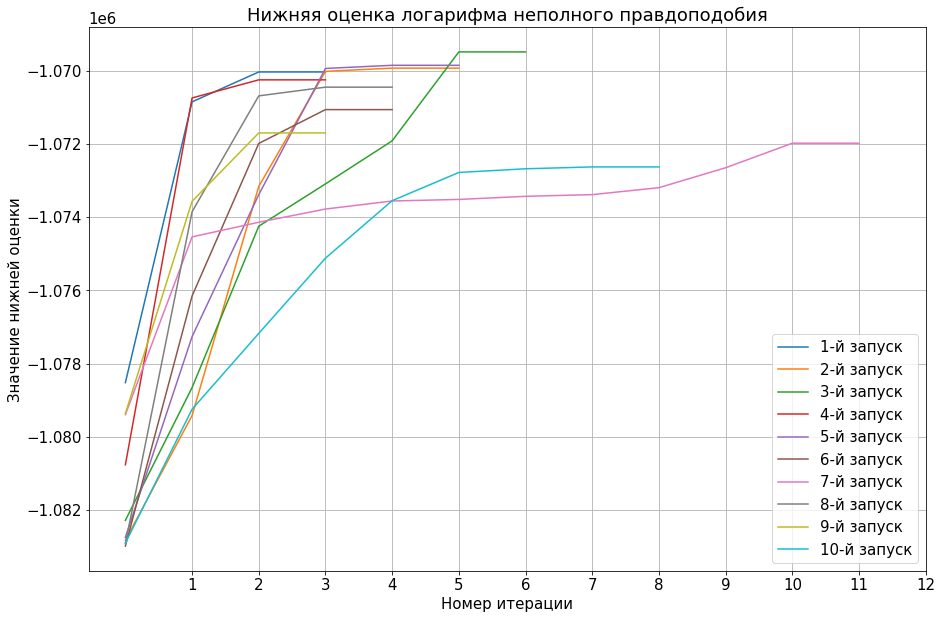

In [210]:
plt.figure(figsize=(15, 10))
plt.title('Нижняя оценка логарифма неполного правдоподобия')
for i in range(len(LLs)):
    plt.plot(LLs[i], label=f'{i + 1}-й запуск')
plt.xticks(np.arange(max([len(x) for x in LLs])) + 1)
plt.xlabel('Номер итерации')
plt.ylabel('Значение нижней оценки')
plt.grid(True)
plt.legend()
plt.savefig('L_plot_av_uniform_time_MAP.png')

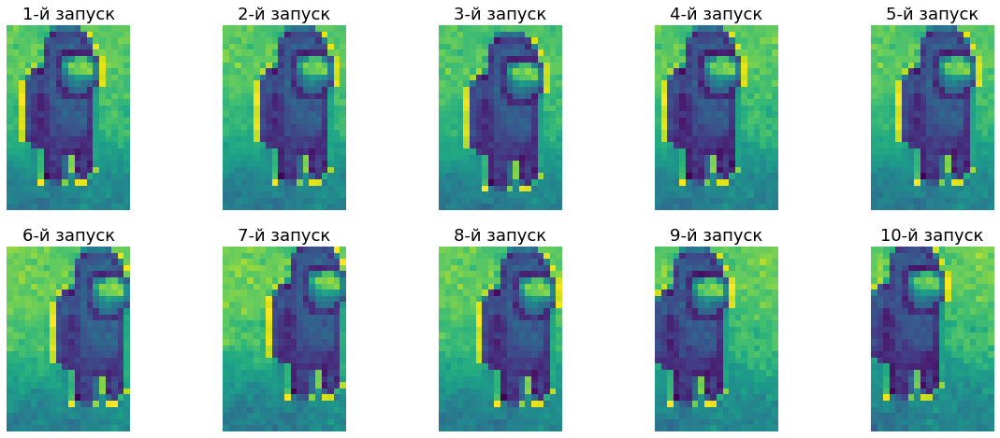

In [211]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Fs[i])
    
plt.savefig('F_av_uniform_time_MAP.png')

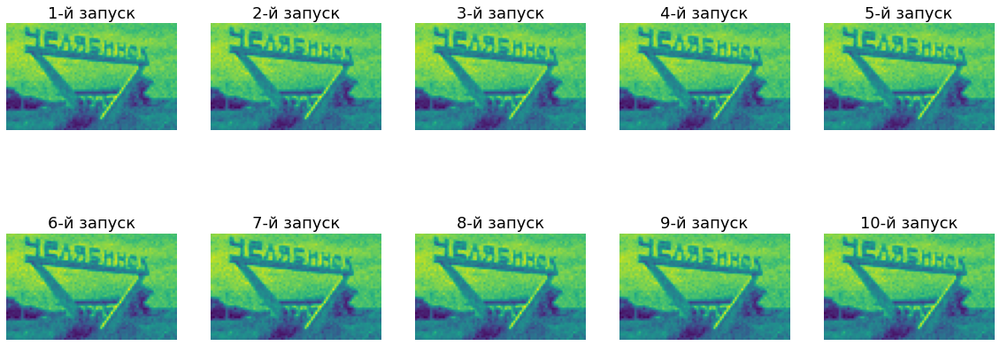

In [212]:
fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 8))

for i in range(len(Fs)):
    axes_i = axes[i // 5, i % 5]
    axes_i.set_title(f'{i + 1}-й запуск')
    axes_i.axis(False)
    axes_i.imshow(Bs[i])
    
plt.savefig('B_av_uniform_MAP.png')

## Применение алгоритма к данным с зашумленными снимками преступника

In [213]:
w = 67
h = 100
X_50 = np.load('data_vmk22_50.npy')
X_100 = np.load('data_vmk22_100.npy')
X_300 = np.load('data_vmk22_300.npy')
X_500 = np.load('data_vmk22_500.npy')

In [221]:
F_500, B_500, s_500, A_500, L_500 = run_EM_with_restarts(X_500, h, w, tolerance=1e-6, max_iter=100, n_restarts=20, init_type='norm')

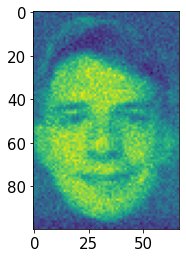

In [222]:
plt.imshow(F_500)

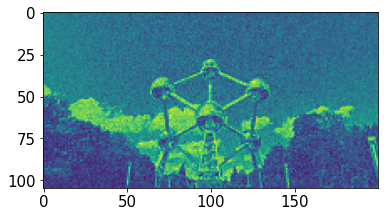

In [223]:
plt.imshow(B_500)

In [228]:
F_50, B_50, s_50, A_50, L_50 = run_EM_with_restarts(X_50, h, w, tolerance=1e-6, max_iter=100, n_restarts=20, init_type='norm')
F_100, B_100, s_100, A_100, L_100 = run_EM_with_restarts(X_100, h, w, tolerance=1e-6, max_iter=100, n_restarts=20, init_type='norm')
F_300, B_300, s_300, A_300, L_300 = run_EM_with_restarts(X_300, h, w, tolerance=1e-6, max_iter=100, n_restarts=20, init_type='norm')
F_500, B_500, s_500, A_500, L_500 = run_EM_with_restarts(X_500, h, w, tolerance=1e-6, max_iter=100, n_restarts=20, init_type='norm')

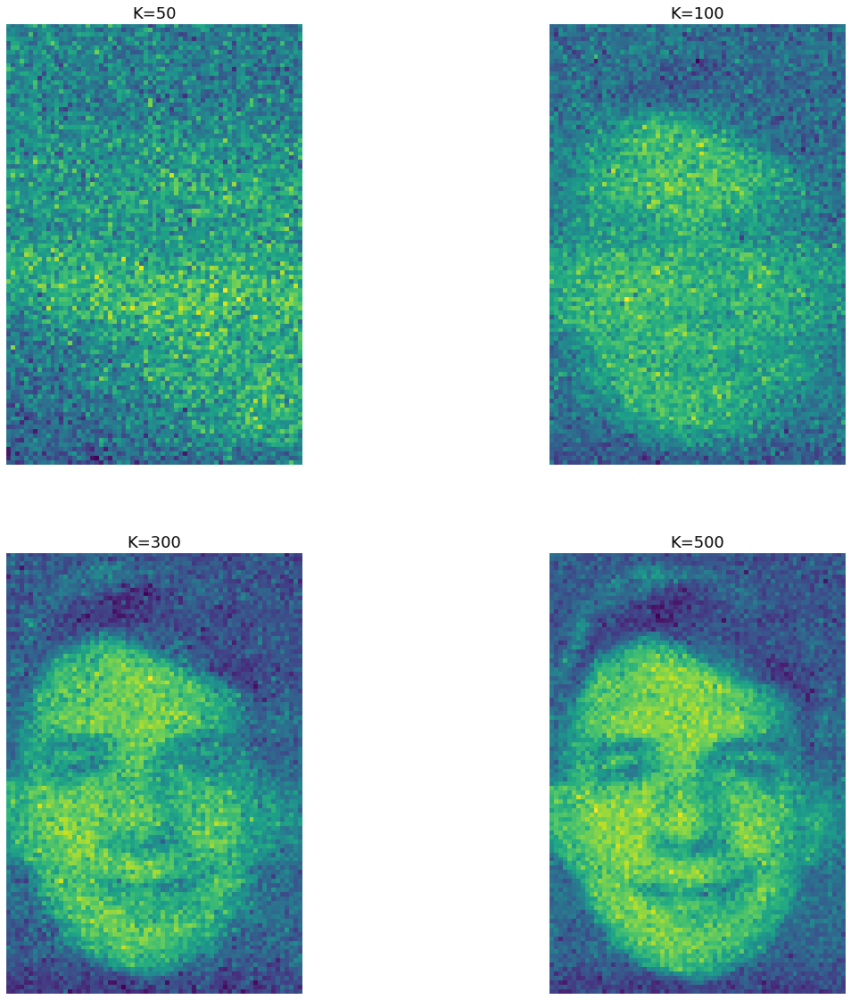

In [229]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(20, 20))
Ks = [50, 100, 300, 500]
Fs = [F_50, F_100, F_300, F_500]
Bs = [B_50, B_100, B_300, B_500]

for i in range(4):
    axes[i // 2, i % 2].set_title(f'K={Ks[i]}')
    axes[i // 2, i % 2].axis(False)
    axes[i // 2, i % 2].imshow(Fs[i])
    
plt.savefig('F_suspects.png')

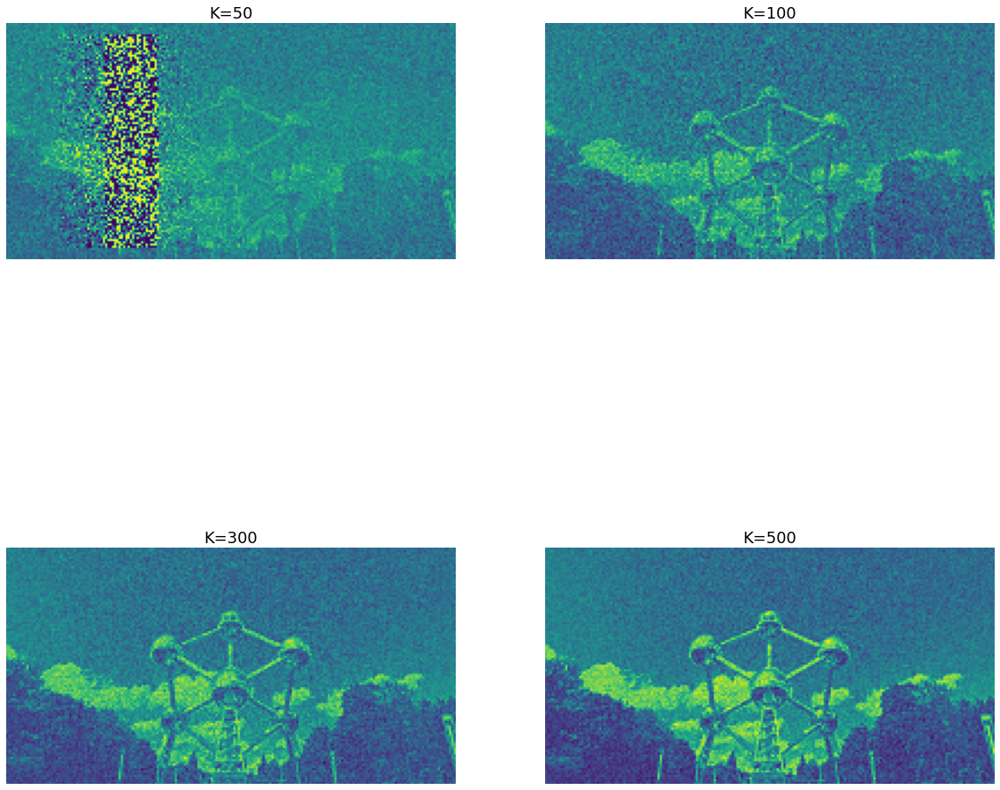

In [230]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(20, 20))

for i in range(4):
    axes[i // 2, i % 2].set_title(f'K={Ks[i]}')
    axes[i // 2, i % 2].axis(False)
    axes[i // 2, i % 2].imshow(Bs[i])
    
plt.savefig('F_backgrounds.png')

In [232]:
F_50_MAP, B_50_MAP, s_50_MAP, A_50_MAP, L_50_MAP = run_EM_with_restarts(X_50, h, w, tolerance=1e-6, max_iter=100, n_restarts=20, use_MAP=True, init_type='norm')
F_100_MAP, B_100_MAP, s_100_MAP, A_100_MAP, L_100_MAP = run_EM_with_restarts(X_100, h, w, tolerance=1e-6, max_iter=100, n_restarts=20, use_MAP=True, init_type='norm')
F_300_MAP, B_300_MAP, s_300_MAP, A_300_MAP, L_300_MAP = run_EM_with_restarts(X_300, h, w, tolerance=1e-6, max_iter=100, n_restarts=20, use_MAP=True, init_type='norm')
F_500_MAP, B_500_MAP, s_500_MAP, A_500_MAP, L_500_MAP = run_EM_with_restarts(X_500, h, w, tolerance=1e-6, max_iter=100, n_restarts=20, use_MAP=True, init_type='norm')

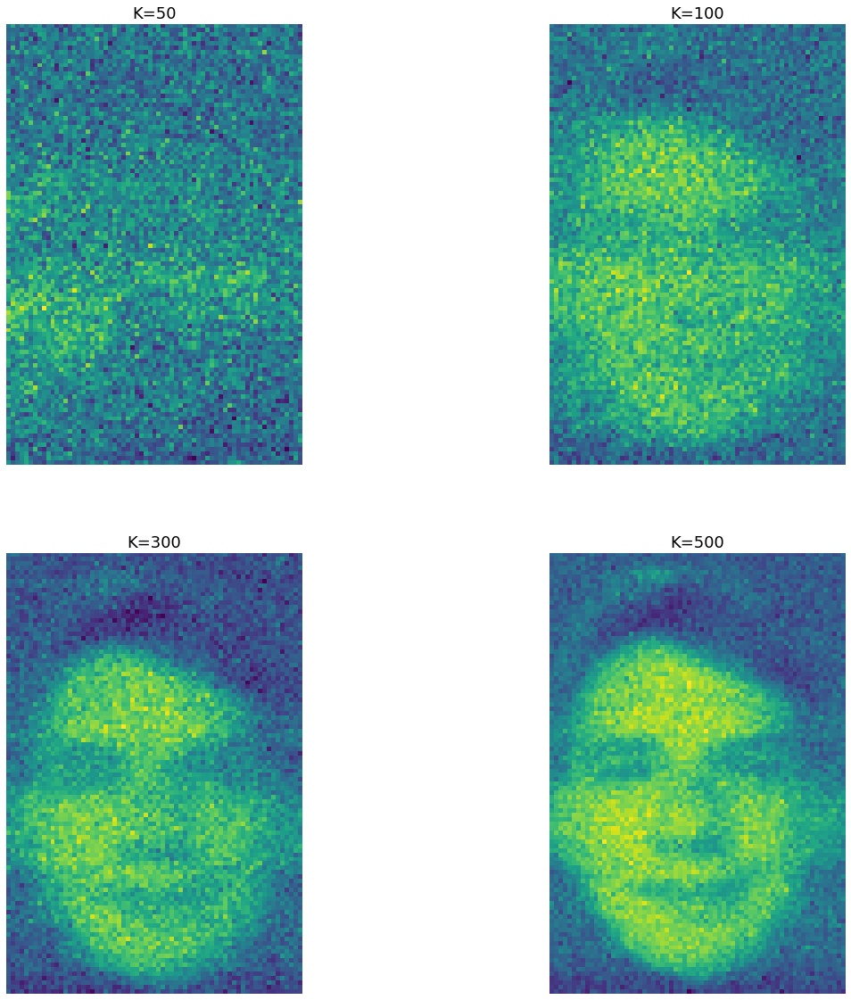

In [233]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(20, 20))
Ks = [50, 100, 300, 500]
Fs = [F_50_MAP, F_100_MAP, F_300_MAP, F_500_MAP]
Bs = [B_50_MAP, B_100_MAP, B_300_MAP, B_500_MAP]

for i in range(4):
    axes[i // 2, i % 2].set_title(f'K={Ks[i]}')
    axes[i // 2, i % 2].axis(False)
    axes[i // 2, i % 2].imshow(Fs[i])
    
plt.savefig('F_suspects_MAP.png')

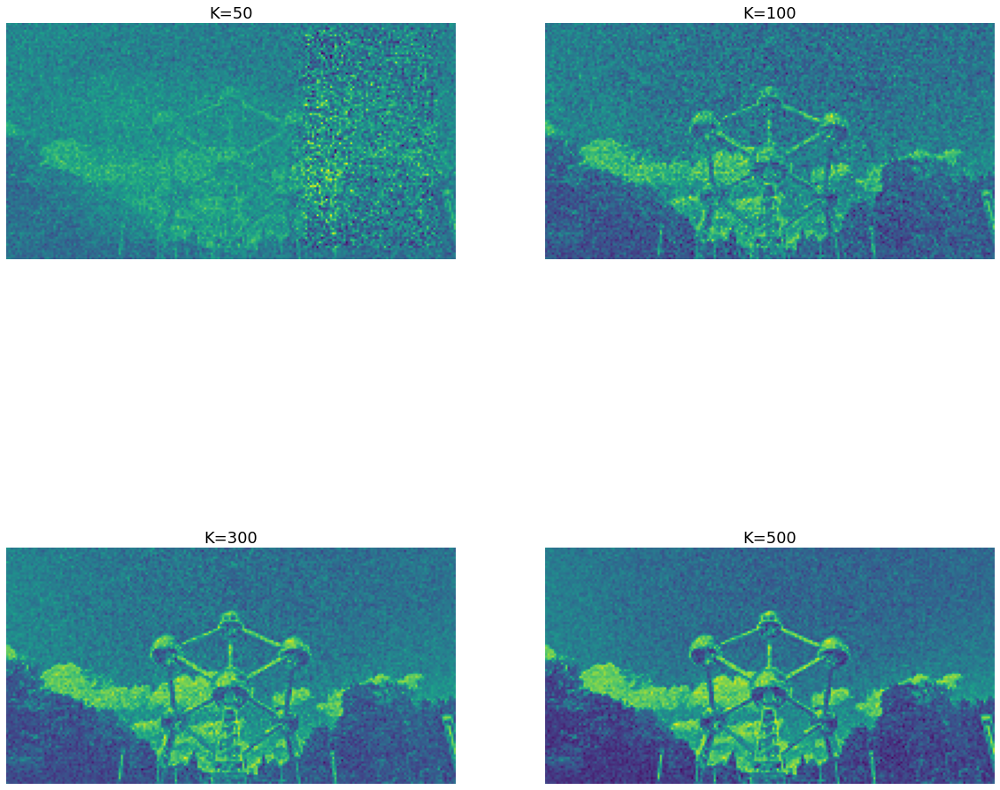

In [234]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(20, 20))

for i in range(4):
    axes[i // 2, i % 2].set_title(f'K={Ks[i]}')
    axes[i // 2, i % 2].axis(False)
    axes[i // 2, i % 2].imshow(Bs[i])
    
plt.savefig('F_backgrounds_MAP.png')